In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
inputDirNames = ['../Data/20231130_102320_thrscan/thrscan_analysis_output',
                 '../Data/20231130_103947_thrscan/thrscan_analysis_output',
                 '../Data/20231130_105938_thrscan/thrscan_analysis_output']
titlesList = ['chip id: 0x70', 'chip id: 0x71', 'chip id: 0x72', 'chip id: 0x73', 'chip id: 0x74']

In [3]:
dfs = [ [] for _ in range(len(inputDirNames))]
for idx, inputDirName in enumerate(inputDirNames):
    for filename in sorted(os.listdir(inputDirName)):
        if 'log' not in filename:
            print(os.path.join(inputDirName, filename))
            if os.stat(os.path.join(inputDirName, filename)).st_size == 0: continue
            df = pd.read_csv(os.path.join(inputDirName, filename), sep=' ', names=['x', 'y', 'thr', 'err', 'noise'])
            dfs[idx].append(df)

../Data/20231130_102320_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x70.txt
../Data/20231130_102320_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x71.txt
../Data/20231130_102320_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x72.txt
../Data/20231130_102320_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x73.txt
../Data/20231130_102320_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x74.txt
../Data/20231130_102320_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x78.txt
../Data/20231130_102320_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x79.txt
../Data/20231130_102320_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x7a.txt
../Data/20231130_102320_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x7b.txt
../Data/20231130_102320_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x7c.txt
../Data/20231130_103947_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x70.txt
../Data/20231130_103947_thrscan/thrscan_analysis_output/FitValues_hitmap_id0

23550.9
32379.0
295.5
295.5
293.9


/tmp/ipykernel_4671/3386947284.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


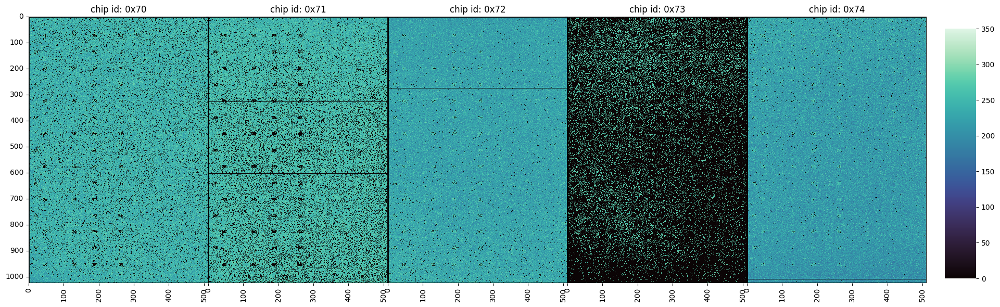

In [4]:
# Draw the hist2d plot of first dfs
fig, axn = plt.subplots(1, 5, figsize=(20, 6), sharey=True, gridspec_kw={'wspace': 0})
cbar_ax = fig.add_axes([.91, .1, .03, .8])

for i, ax in enumerate(axn.flat):
    df_thr = dfs[0][i].pivot(index='x', columns='y', values='thr')
    df_thr.fillna(0, inplace=True)
    # Ensure all values in the range are present using reindex
    x_range = np.arange(0, 1024)
    y_range = np.arange(0, 512)
    df_thr = df_thr.reindex(index=x_range, columns=y_range, fill_value=0)
    
    print(dfs[0][i]["thr"].max())
    sns.heatmap(data=df_thr, ax=ax,
                cbar=i == 0,
                vmin=0, vmax=350,
                cbar_ax=None if i else cbar_ax,
                cmap=sns.color_palette("mako", as_cmap=True))
    
    # Add a black box around each subplot
    rect = mpl.patches.Rectangle((0, 0), 1, 1, linewidth=2, edgecolor='black', facecolor='none', transform=ax.transAxes)
    ax.add_patch(rect)

    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(titlesList[i])
    ax.set_xticks(np.arange(0, 512, 100))
    ax.set_xticklabels(np.arange(0, 512, 100))
    ax.set_yticks(np.arange(0, 1024, 100))
    ax.set_yticklabels(np.arange(0, 1024, 100))
    plt.axis('on')

sns.set_style({"xtick.direction": "in", "ytick.direction": "in"})
plt.subplots_adjust(wspace=0, hspace=0)

fig.tight_layout(rect=[0, 0, .9, 1])

plt.show()

257.0
263.1
240.0
288.3
280.8


/tmp/ipykernel_4671/3118366030.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


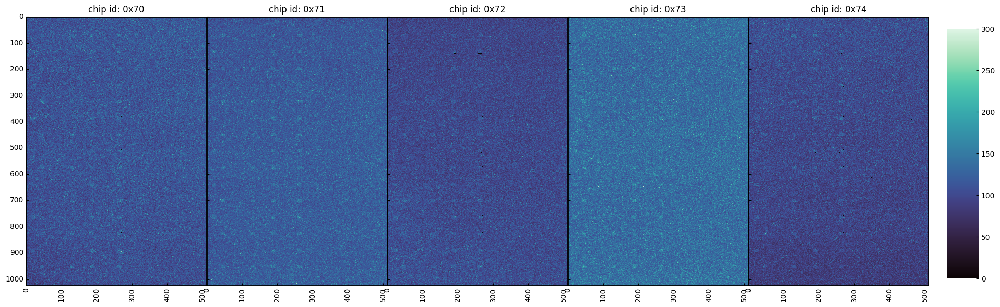

In [5]:
# Draw the hist2d plot of second dfs
fig, axn = plt.subplots(1, 5, figsize=(20, 6), sharey=True, gridspec_kw={'wspace': 0})
cbar_ax = fig.add_axes([.91, .1, .03, .8])

for i, ax in enumerate(axn.flat):
    df_thr = dfs[1][i].pivot(index='x', columns='y', values='thr')
    df_thr.fillna(0, inplace=True)
    # Ensure all values in the range are present using reindex
    x_range = np.arange(0, 1024)
    y_range = np.arange(0, 512)
    df_thr = df_thr.reindex(index=x_range, columns=y_range, fill_value=0)
    
    print(dfs[1][i]["thr"].max())
    sns.heatmap(data=df_thr, ax=ax,
                cbar=i == 0,
                vmin=0, vmax=300,
                cbar_ax=None if i else cbar_ax,
                cmap=sns.color_palette("mako", as_cmap=True))
    
    # Add a black box around each subplot
    rect = mpl.patches.Rectangle((0, 0), 1, 1, linewidth=2, edgecolor='black', facecolor='none', transform=ax.transAxes)
    ax.add_patch(rect)

    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(titlesList[i])
    ax.set_xticks(np.arange(0, 512, 100))
    ax.set_xticklabels(np.arange(0, 512, 100))
    ax.set_yticks(np.arange(0, 1024, 100))
    ax.set_yticklabels(np.arange(0, 1024, 100))
    plt.axis('on')

sns.set_style({"xtick.direction": "in", "ytick.direction": "in"})
plt.subplots_adjust(wspace=0, hspace=0)

fig.tight_layout(rect=[0, 0, .9, 1])

plt.show()

257.0
263.1
240.0
288.3
280.8


/tmp/ipykernel_4671/981481436.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


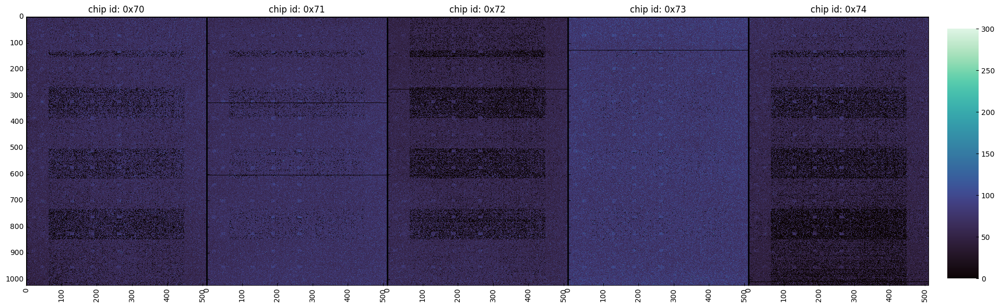

In [20]:
# Draw the hist2d plot of third dfs
fig, axn = plt.subplots(1, 5, figsize=(24, 8), sharey=True, gridspec_kw={'wspace': 0})
cbar_ax = fig.add_axes([.91, .1, .03, .8])

for i, ax in enumerate(axn.flat):
    df_thr = dfs[2][i].pivot(index='x', columns='y', values='thr')
    df_thr.fillna(0, inplace=True)
    # Ensure all values in the range are present using reindex
    x_range = np.arange(0, 1024)
    y_range = np.arange(0, 512)
    df_thr = df_thr.reindex(index=x_range, columns=y_range, fill_value=0)
    
    print(dfs[1][i]["thr"].max())
    sns.heatmap(data=df_thr, ax=ax,
                cbar=i == 0,
                vmin=0, vmax=300,
                cbar_ax=None if i else cbar_ax,
                cmap=sns.color_palette("mako", as_cmap=True))
    
    # Add a black box around each subplot
    rect = mpl.patches.Rectangle((0, 0), 1, 1, linewidth=2, edgecolor='black', facecolor='none', transform=ax.transAxes)
    ax.add_patch(rect)

    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(titlesList[i])
    ax.set_xticks(np.arange(0, 512, 100))
    ax.set_xticklabels(np.arange(0, 512, 100))
    ax.set_yticks(np.arange(0, 1024, 100))
    ax.set_yticklabels(np.arange(0, 1024, 100))
    plt.axis('on')

sns.set_style({"xtick.direction": "in", "ytick.direction": "in"})
plt.subplots_adjust(wspace=0, hspace=0)

fig.tight_layout(rect=[0, 0, .9, 1])

plt.show()

           x    y    thr  err  noise
0          0    0  138.8  6.1   0.06
1          0    1   97.6  5.1   0.00
2          0    2  105.9  5.4   0.00
3          0    3  110.5  2.1   0.00
4          0    4  108.4  6.1   0.06
...      ...  ...    ...  ...    ...
524221  1023  506  100.2  3.4   0.04
524222  1023  507  173.5  5.3   0.00
524223  1023  508  129.9  5.1   0.00
524224  1023  509   98.2  5.9   0.00
524225  1023  510  117.9  5.2   0.01

[524226 rows x 5 columns]
0 132.5
1 93.3
2 93.3
3 103.3
4 97.2
5 123.1
6 103.3
7 114.2
8 99.2
9 128.2
10 111.2
11 133.4
12 101.8
13 118.3
14 118.1
15 118.7
16 92.8
17 99.2
18 113.1
19 120.4
20 89.6
21 82.5
22 104.4
23 97.4
24 80.8
25 90.7
26 107.8
27 131.4
28 122.5
29 106.4
30 89.9
31 97.2
32 105.4
33 116.9
34 90.7
35 130.9
36 120.5
37 139.3
38 109.8
39 111.2
40 137.3
41 118.6
42 156.1
43 106.6
44 133.5
45 112.7
46 134.0
47 118.7
48 122.1
49 125.3
50 127.8
51 118.3
52 93.3
53 126.1
54 133.5
55 100.2
56 108.2
57 91.9
58 99.5
59 118.6
60 110.5
61 117.

/tmp/ipykernel_4671/3660925929.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  df_thr = df.pivot('x', 'y', 'thr')


264 120.0
265 131.8
266 122.5
267 136.0
268 153.1
269 128.2
270 135.8
271 122.5
272 111.4
273 108.4
274 124.6
275 109.8
276 102.2
277 116.3
278 103.2
279 115.3
280 121.1
281 118.2
282 140.3
283 113.2
284 99.5
285 117.3
286 90.6
287 108.7
288 130.1
289 132.4
290 86.7
291 110.3
292 93.9
293 95.1
294 115.8
295 105.3
296 117.9
297 91.9
298 95.1
299 113.2
300 92.3
301 96.0
302 133.5
303 131.8
304 97.2
305 117.3
306 111.7
307 119.0
308 92.8
309 125.7
310 141.8
311 128.4
312 149.9
313 105.4
314 107.1
315 147.7
316 95.0
317 115.3
318 105.9
319 91.2
320 108.0
321 108.1
322 117.3
323 131.9
324 103.1
325 92.3
326 106.1
327 115.3
328 116.9
329 117.3
330 134.5
331 109.8
332 139.3
333 147.6
334 113.7
335 98.8
336 106.6
337 152.2
338 131.4
339 105.9
340 116.3
341 109.1
342 95.1
343 122.1
344 142.3
345 120.5
346 109.3
347 109.8
348 117.3
349 168.6
350 154.8
351 115.8
352 123.6
353 112.2
354 114.8
355 135.5
356 101.8
357 114.2
358 121.7
359 94.5
360 135.5
361 100.2
362 99.5
363 117.3
364 106.7
365 131.

<Axes: xlabel='y', ylabel='x'>

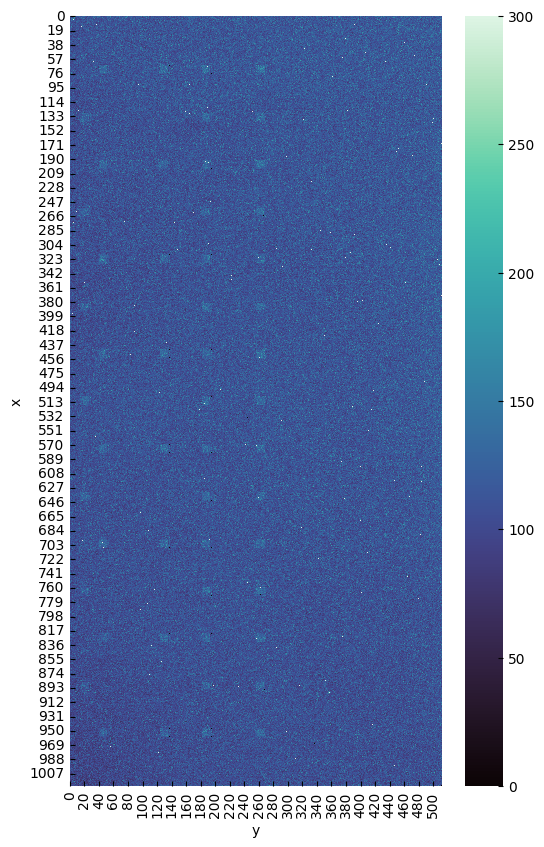

In [7]:
df = dfs[1][0].copy()
df.loc[df['thr'] > 200, 'thr'] = 1000
print(df)
df_thr = df.pivot('x', 'y', 'thr')
df_thr.fillna(0, inplace=True)
df_filtered = df_thr[df_thr.index == 200]
for i in range(len(df_filtered.columns)):
    print(i, df_filtered.iloc[0][i])
print(dfs[1][0]["thr"].max())
fig, ax = plt.subplots(figsize=(6, 10))
sns.heatmap(data=df_thr, ax=ax,
            vmin=0, vmax=300,
            cmap=sns.color_palette("mako", as_cmap=True))

<Axes: xlabel='y', ylabel='x'>

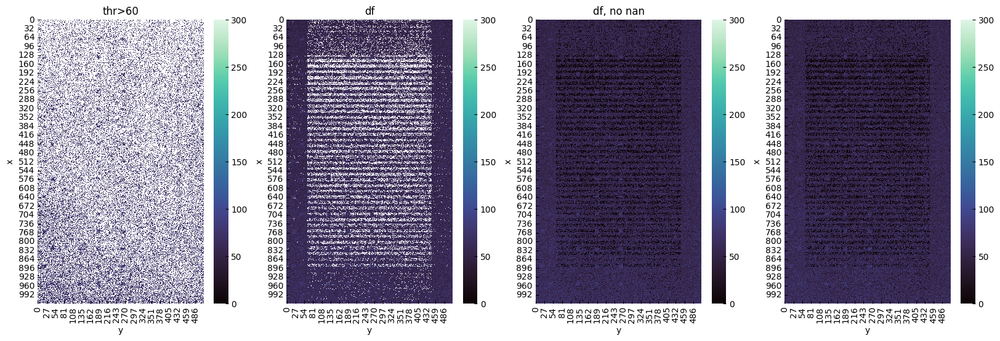

In [16]:
df = pd.read_csv("../Data/20231130_105938_thrscan/thrscan_analysis_output/FitValues_hitmap_id0x72.txt", sep=' ', names=['x', 'y', 'thr', 'err', 'noise'])
#print(df.loc[df['thr'] > 130].head(50))

fig, ax = plt.subplots(1,4,figsize=(20, 6))
ax=ax.flatten()


df_filtered = df.loc[df['thr'] > 60]
df_thr_filtered = df_filtered.pivot(index='x', columns='y', values='thr')
#df_thr_filtered.fillna(0, inplace=True)
# Ensure all values in the range are present using reindex
x_range = np.arange(0, 1024)
y_range = np.arange(0, 512)
df_thr_filtered = df_thr_filtered.reindex(index=x_range, columns=y_range, fill_value=0)
sns.heatmap(data=df_thr_filtered, ax=ax[0],
            vmin=0, vmax=300,
            cmap=sns.color_palette("mako", as_cmap=True))
ax[0].set_title('thr>60')


p_df=df.pivot(index='x', columns='y', values='thr')
# Ensure all values in the range are present using reindex
x_range = np.arange(0, 1024)
y_range = np.arange(0, 512)
p_df = p_df.reindex(index=x_range, columns=y_range, fill_value=0)
sns.heatmap(data=p_df, ax=ax[1],
            vmin=0, vmax=300,
            cmap=sns.color_palette("mako", as_cmap=True))
ax[1].set_title('df')

p_df_no_nan=df.pivot(index='x', columns='y', values='thr')
# Ensure all values in the range are present using reindex
x_range = np.arange(0, 1024)
y_range = np.arange(0, 512)
p_df_no_nan.fillna(0, inplace=True)
p_df_no_nan = p_df_no_nan.reindex(index=x_range, columns=y_range, fill_value=0)
sns.heatmap(data=p_df_no_nan, ax=ax[2],
            vmin=0, vmax=300,
            cmap=sns.color_palette("mako", as_cmap=True))
ax[2].set_title('df, no nan')


df_thr = dfs[2][2].pivot(index='x', columns='y', values='thr')
df_thr.fillna(0, inplace=True)
# Ensure all values in the range are present using reindex
x_range = np.arange(0, 1024)
y_range = np.arange(0, 512)
df_thr = df_thr.reindex(index=x_range, columns=y_range, fill_value=0)

sns.heatmap(data=df_thr, ax=ax[3],
            vmin=0, vmax=300,
            cmap=sns.color_palette("mako", as_cmap=True))